In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import PIL 
from PIL import Image as im

In [2]:
def plot_image(img: np.array):
    plt.figure(figsize=(100, 10))
    plt.imshow(img, cmap='gray');
    
def plot_two_images(img1: np.array, img2: np.array , label1="img1" , label2="img2"):
    _, ax = plt.subplots(1, 2, figsize=(6, 3))
    ax[0].imshow(img1, cmap='gray')
    ax[0].set_title(label1, fontstyle='italic')
    ax[1].imshow(img2, cmap='gray')
    ax[1].set_title(label2, fontstyle='italic');

def plot_three_images(img1: np.array, img2: np.array ,img3: np.array , label1="img1" ,label2="img2" ,label3="img3"):
    _, ax = plt.subplots(1, 3, figsize=(20, 10))
    ax[0].imshow(img1, cmap='gray')
    ax[0].set_title(label1, fontstyle='italic')
    ax[1].imshow(img2, cmap='gray')
    ax[1].set_title(label2, fontstyle='italic')
    ax[2].imshow(img3, cmap='gray')
    ax[2].set_title(label3, fontstyle='italic');

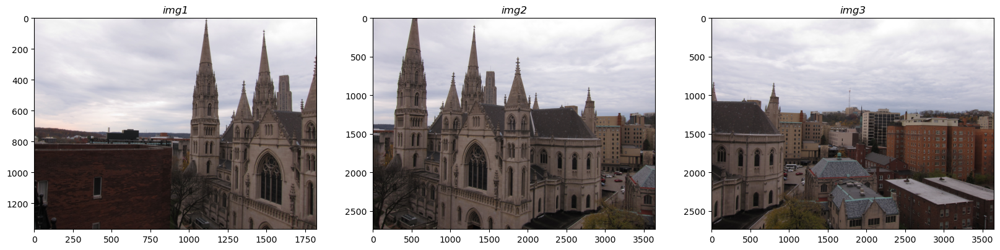

In [3]:
# Load the three images
image1 = cv2.imread('im1.jpg')
image2 = cv2.imread('im2.jpg')
image3 = cv2.imread('im3.jpg')

image1 = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
image2 = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)
image3 = cv2.cvtColor(image3, cv2.COLOR_BGR2RGB)


plot_three_images(image1 ,image2,image3)

In [4]:
# Create SIFT object
sift = cv2.SIFT_create()

# Find keypoints and descriptors for the first two images
kp1, des1 = sift.detectAndCompute(image1, None)
kp2, des2 = sift.detectAndCompute(image2, None)

# Create BFMatcher object
bf = cv2.BFMatcher()

# Match descriptors using BFMatcher
matches = bf.match(des1, des2)

# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)

# Get source and destination points
src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

# Calculate homography matrix
H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)

# Warp second image and combine with first image
img12 = cv2.warpPerspective(image2, H, (image1.shape[1]+image2.shape[1], image1.shape[0]))
img12[0:image1.shape[0], 0:image1.shape[1]] = image1

In [5]:
img12= cv2.cvtColor(img12, cv2.COLOR_BGR2RGB)
data = im.fromarray(img12)
data.save("im12.png")

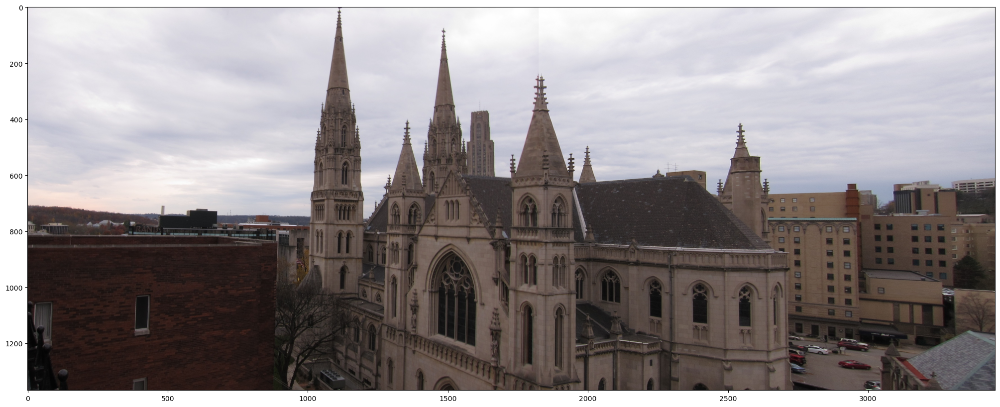

In [6]:
img = cv2.imread("im12.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
contours,hierarchy = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnt = contours[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:y+h,x:x+w-70]
cv2.imwrite("im12.png",crop)
img12 = cv2.imread("im12.png")
# check point
#img12 = cv2.cvtColor(img12,cv2.COLOR_BGR2GRAY)
plot_image(img12)

In [7]:
# Find keypoints and descriptors for the second and third images
kp2, des2 = sift.detectAndCompute(image2, None)
kp3, des3 = sift.detectAndCompute(image3, None)
# Match descriptors using BFMatcher
matches = bf.match(des2, des3)
# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)
# Get source and destination points
src_pts = np.float32([kp2[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp3[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
# Calculate homography matrix
H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
# Warp third image and combine with the stitched result
img23 = cv2.warpPerspective(image3, H, (image2.shape[1]+image3.shape[1], image2.shape[0]))
img23[0:image2.shape[0], 0:image2.shape[1]] = image2

In [8]:
img23= cv2.cvtColor(img23, cv2.COLOR_BGR2RGB)
data = im.fromarray(img23)
data.save("im23.png")

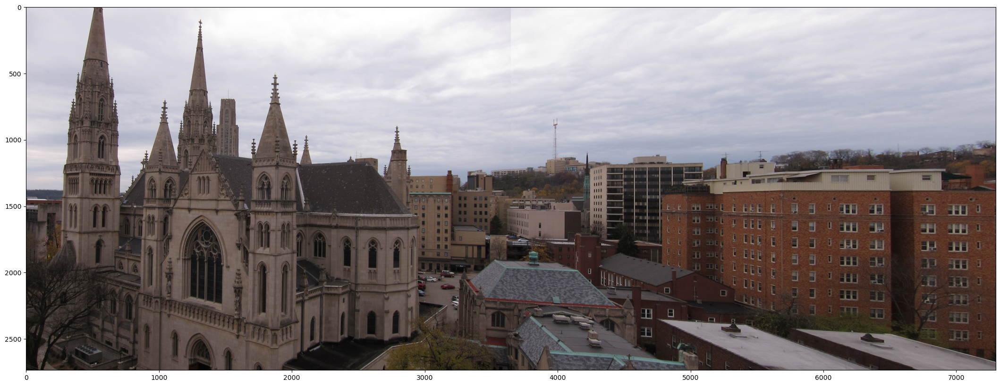

In [9]:
img = cv2.imread("im23.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
contours,hierarchy = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnt = contours[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:y+h,x:x+w]
cv2.imwrite("im23.png",crop)
img23 = cv2.imread("im23.png")
#img23 = cv2.cvtColor(img23,cv2.COLOR_BGR2GRAY)
plot_image(img23)

In [10]:
# Find keypoints and descriptors for the img12 and img23 images
kp2, des2 = sift.detectAndCompute(img12, None)
kp3, des3 = sift.detectAndCompute(img23, None)
# Match descriptors using BFMatcher
matches = bf.match(des2, des3)
# Sort matches by distance
matches = sorted(matches, key=lambda x: x.distance)
# Get source and destination points
src_pts = np.float32([kp2[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp3[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
# Calculate homography matrix
H, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
# Warp third image and combine with the stitched result
panorama = cv2.warpPerspective(img23, H, (img12.shape[1]+img23.shape[1], img12.shape[0]))
panorama[0:img12.shape[0], 0:img12.shape[1]] = img12
# plt.figure(figsize=(20, 20))
# plt.imshow(panorama)

In [11]:
panorama= cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)
data = im.fromarray(panorama)
panorama= cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB)
data.save("panorama.png")

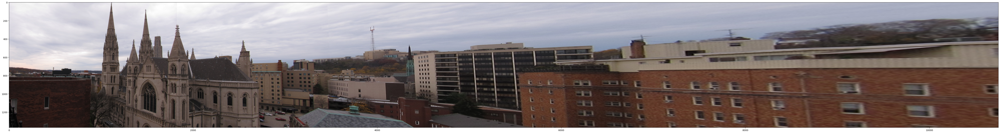

In [12]:
img = cv2.imread("panorama.png")
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
_,thresh = cv2.threshold(gray,1,255,cv2.THRESH_BINARY)
contours,hierarchy = cv2.findContours(thresh,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)
cnt = contours[0]
x,y,w,h = cv2.boundingRect(cnt)
crop = img[y:y+h,x:x+w]
cv2.imwrite("panorama.png",crop)
panorama = cv2.imread("panorama.png")
#img23 = cv2.cvtColor(img23,cv2.COLOR_BGR2GRAY)
plot_image(panorama)